# Basic Tutorial

Trey V. Wenger (c) March 2024

Here we demonstrate the various ways to use `Caribou`. We start by importing the package and loading the example data.

In [1]:
from IPython.display import SVG, display
    
import os
import pickle

import matplotlib.pyplot as plt
import arviz as az
import pandas as pd

import caribou
from caribou import SimpleModel
from caribou.plots import plot_pair

print("Caribou:", caribou.__version__)

pd.options.display.max_rows = None

# plot directory and extension
figdir = "figures"
ext = "svg"
if not os.path.isdir(figdir):
    os.mkdir(figdir)

Caribou: 0.0.1b


In [2]:
# Load example data
with open("example_data.pkl", "rb") as f:
    data = pickle.load(f)
print(data.keys())

dict_keys(['emission_velocity', 'emission_spectrum', 'emission_noise', 'absorption_velocity', 'absorption_spectrum', 'absorption_noise'])


Here we already have a data dictionary prepared. Each dictionary element is a 1-D array of scalar values, where all of the `emission` arrays must have the same length, all of the `absorption` arrays must have the same length, and `emission_velocity` and `absorption_velocity` must be in the same reference frame. The `velocity` axes have units `km s-1`, the emission spectrum is the brightness temperature in `K`, and the absorption spectrum is the optical depth spectrum. The `noise` arrays define the channel-dependent rms spectral noise.

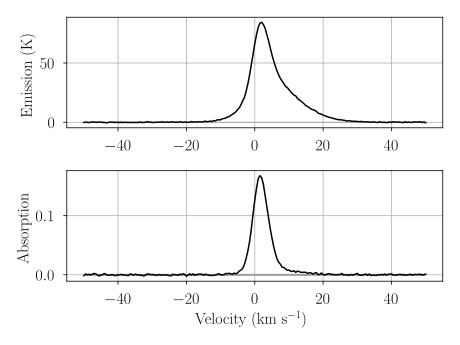

In [3]:
# Plot example data
fig, (ax0, ax1) = plt.subplots(2)
ax0.plot(data["emission_velocity"], data["emission_spectrum"], "k-")
ax0.fill_between(
    data["emission_velocity"],
    -1.5 * data["emission_noise"],
    1.5 * data["emission_noise"],
    color="k",
    edgecolor="none",
    lw=0,
    alpha=0.5,
)
ax0.set_ylabel("Emission (K)")
ax1.plot(data["absorption_velocity"], data["absorption_spectrum"], "k-")
ax1.fill_between(
    data["absorption_velocity"],
    -1.5 * data["absorption_noise"],
    1.5 * data["absorption_noise"],
    color="k",
    edgecolor="none",
    lw=0,
    alpha=0.5,
)
ax1.set_ylabel("Absorption")
ax1.set_xlabel(r"Velocity (km s$^{-1}$)")
fig.tight_layout()
fig.savefig(f"{figdir}/data.{ext}")
plt.close(fig)

SVG(f"{figdir}/data.{ext}")

## `SimpleModel`

We begin with a four-cloud (`n_cloud=4`) model, with a 2nd order polynomial baseline (`baseline_degree=2`).

In [4]:
model = SimpleModel(data, n_clouds=4, baseline_degree=2, seed=1234, verbose=True)

# use default priors
# model.set_priors()

# manually set priors
model.set_priors(
    prior_log10_NHI = [20.0, 1.0], # cm-2
    prior_log10_kinetic_temp = [3.0, 1.0], # K
    prior_log10_density = [0.0, 1.0], # cm-3
    prior_log10_n_alpha = [-6.0, 1.0], # cm-3
    prior_log10_larson_linewidth = [0.2, 0.1], # km s-1
    prior_larson_power = [0.4, 0.1],
    prior_velocity = [0.0, 10.0],
)

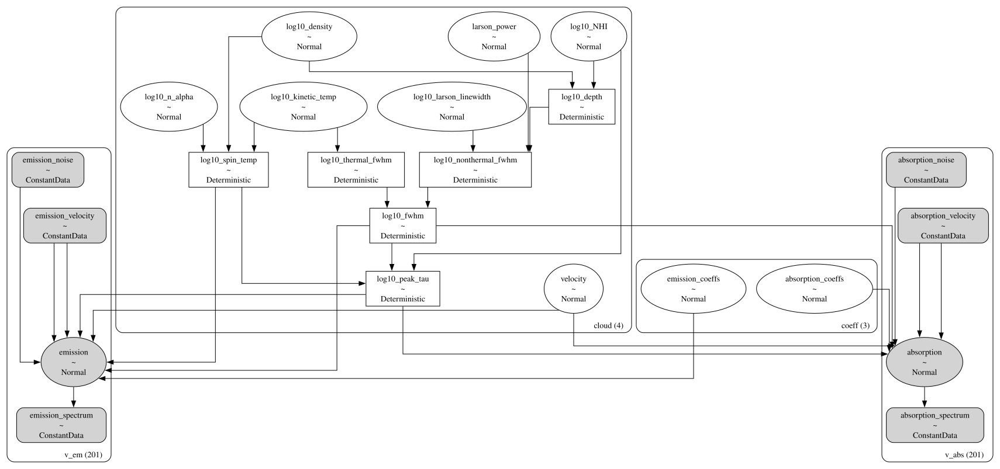

In [5]:
# Plot model graph
model.plot_graph(f"{figdir}/simple_model.gv", "svg")
SVG(f"{figdir}/simple_model.gv.{ext}")

In [6]:
# model string representation
print(model.model.str_repr())

       emission_coeffs ~ Normal(0, 1)
     absorption_coeffs ~ Normal(0, 1)
             log10_NHI ~ Normal(20, 1)
    log10_kinetic_temp ~ Normal(3, 1)
         log10_density ~ Normal(0, 1)
         log10_n_alpha ~ Normal(-6, 1)
log10_larson_linewidth ~ Normal(0.2, 0.1)
          larson_power ~ Normal(0.4, 0.1)
              velocity ~ Normal(0, 10)
       log10_spin_temp ~ Deterministic(f(log10_kinetic_temp, log10_n_alpha, log10_density))
    log10_thermal_fwhm ~ Deterministic(f(log10_kinetic_temp))
           log10_depth ~ Deterministic(f(log10_density, log10_NHI))
 log10_nonthermal_fwhm ~ Deterministic(f(log10_larson_linewidth, larson_power, log10_density, log10_NHI))
            log10_fwhm ~ Deterministic(f(log10_larson_linewidth, larson_power, log10_kinetic_temp, log10_density, log10_NHI))
        log10_peak_tau ~ Deterministic(f(log10_NHI, log10_kinetic_temp, log10_larson_linewidth, log10_n_alpha, larson_power, log10_density))
         emission_norm ~ Normal(f(emission_coeffs, l

We check that our prior distributions are reasonable by drawing prior predictive checks. Each colored line is a simulated "observation" with parameters drawn from the prior distributions. You should check that these simulated observations at least somewhat overlap your actual observation (black line).

Sampling: [absorption_coeffs, absorption_norm, emission_coeffs, emission_norm, larson_power, log10_NHI, log10_density, log10_kinetic_temp, log10_larson_linewidth, log10_n_alpha, velocity]


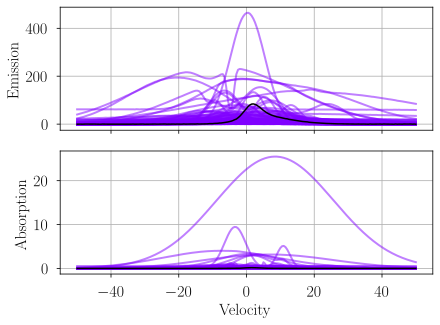

In [7]:
# prior predictive check
prior = model.prior_predictive_check(
    samples=100,  # prior predictive samples
    plot_fname=f"{figdir}/prior_predictive.{ext}",
)
SVG(f"{figdir}/prior_predictive.{ext}")

We can also generate a pair plot to inspect the prior distributions and their effect on deterministic quantities. The model has attributes `cloud_params` for cloud free parameters, `deterministics` for deterministic quantities, `baseline_params` for the free polynomial baseline parameters, and `hyper_params` for any hyperparameters. Here we show the pair plot for the deterministic quantities derived from our prior distributions.

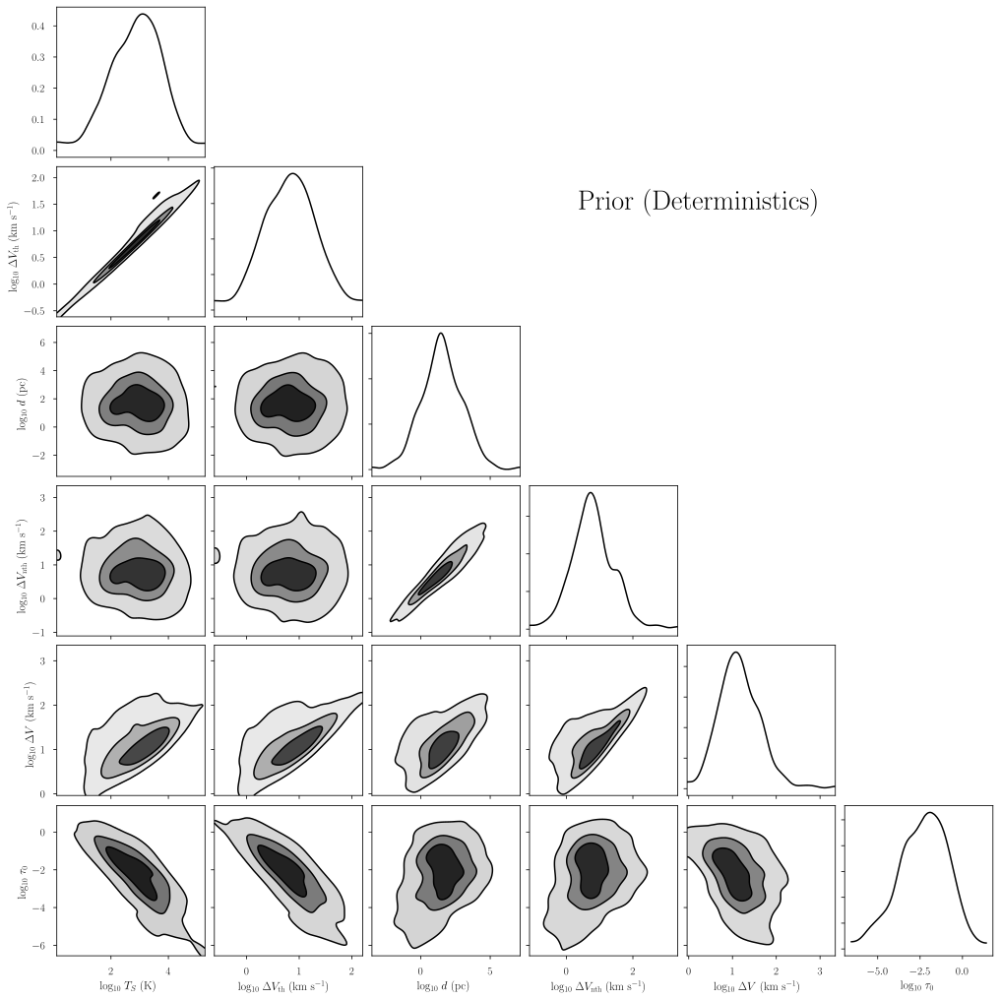

In [8]:
plot_pair(
    prior.prior, # samples
    model.deterministics, # var_names to plot
    "Prior (Deterministics)", # plot label
    f"{figdir}/pair_prior_determ.{ext}", # plot filename
    labeller=model.labeller, # label manager
)
SVG(f"{figdir}/pair_prior_determ.{ext}")

## Variational Inference

We can approximate the posterior distribution using variational inference (VI). We will run a maximum of `n` iterations, but stop early if it appears that VI has converged on a solution. If you get a `NaN` error, try increasing `learning_rate` and `abs_tolerance`.

In [9]:
model.fit(
    n = 500_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.01, # VI absolute convergence threshold
    learning_rate = 1e-3, # VI learning rate
)

Convergence achieved at 65900
Interrupted at 65,899 [13%]: Average Loss = 1.2237e+06


In [10]:
# posterior samples stored in model.trace.posterior
az.summary(model.trace.posterior)

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
emission_coeffs[0],0.982,0.077,0.827,1.114,0.003,0.002,934.0,924.0,NaN
emission_coeffs[1],0.282,0.072,0.146,0.409,0.002,0.002,1081.0,1056.0,NaN
emission_coeffs[2],-0.400,0.057,-0.509,-0.300,0.002,0.001,1020.0,863.0,NaN
absorption_coeffs[0],0.049,0.080,-0.099,0.206,0.002,0.002,1038.0,1017.0,NaN
absorption_coeffs[1],0.068,0.073,-0.067,0.206,0.002,0.002,884.0,905.0,NaN
absorption_coeffs[2],-0.021,0.060,-0.136,0.081,0.002,0.002,965.0,948.0,NaN
log10_NHI[0],20.537,0.001,20.535,20.540,0.000,0.000,1010.0,907.0,NaN
log10_NHI[1],20.473,0.002,20.471,20.477,0.000,0.000,810.0,805.0,NaN
log10_NHI[2],20.661,0.002,20.658,20.664,0.000,0.000,1024.0,864.0,NaN
log10_NHI[3],20.871,0.001,20.869,20.873,0.000,0.000,1094.0,921.0,NaN


## MCMC

VI is fast, but it's not particularly accurate, and there is no way to diagnose "convergence". Instead, we sample the posterior distribution using MCMC. Here we initialize the No U-Turn Sampler (NUTS) using VI. We can customize the VI initialization as well as the NUTS parameters. If there are many divergences, or if the resulting effective sample sizes are small and `r_hat` is large, try increasing the number of tuning samples, draws, and/or chains. Increasing `target_accept` to `0.9` or `0.95` can help if there are many divergences. Use as many chains as possible.

In [11]:
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 4, # number of independent chains
    cores = 4, # number of parallel chains
    init_kwargs = {"rel_tolerance": 0.01, "abs_tolerance": 0.01, "learning_rate": 1e-3}, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.8}, # NUTS arguments
)

Initializing NUTS using custom advi+adapt_diag strategy


Convergence achieved at 65900
Interrupted at 65,899 [13%]: Average Loss = 1.2237e+06
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [emission_coeffs, absorption_coeffs, log10_NHI, log10_kinetic_temp, log10_density, log10_n_alpha, log10_larson_linewidth, larson_power, velocity]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 219 seconds.


Only 3 chains appear converged.
There were 16 divergences in converged chains.


One chain did not converge. It is dropped from all subsequent analyses. In the remaining chains, there are some divergences. The number of divergences should be much less than the number of posterior samples.

In general, there could be a labeling degeneracy, or multiple unique solutions. Here we "solve" for those effects using a Gaussian Mixture Model (GMM). The parameter `p_threshold` defines the probability threshold for "unique" GMM solutions.

In [12]:
model.solve(p_threshold=0.9)

GMM converged to unique solution


In [13]:
print("solutions:", model.solutions)
display(az.summary(model.trace["solution_0"]))
# this also works: az.summary(model.trace.solution_0)

solutions: [0]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
emission_coeffs[0],0.616,0.250,0.161,1.079,0.006,0.004,1886.0,2107.0,1.00
emission_coeffs[1],0.209,0.081,0.055,0.354,0.001,0.001,3255.0,1882.0,1.00
emission_coeffs[2],-0.241,0.133,-0.477,0.015,0.003,0.002,1905.0,2287.0,1.00
absorption_coeffs[0],-0.054,0.163,-0.344,0.264,0.003,0.003,2384.0,2208.0,1.00
absorption_coeffs[1],0.052,0.073,-0.092,0.181,0.001,0.001,3406.0,2105.0,1.00
absorption_coeffs[2],0.043,0.101,-0.140,0.239,0.002,0.002,2494.0,1898.0,1.00
log10_NHI[0],20.283,0.124,20.084,20.533,0.006,0.004,454.0,550.0,1.01
log10_NHI[1],20.693,0.054,20.584,20.762,0.003,0.002,474.0,597.0,1.01
log10_NHI[2],20.687,0.034,20.624,20.750,0.001,0.001,793.0,702.0,1.00
log10_NHI[3],20.822,0.033,20.762,20.877,0.001,0.001,787.0,690.0,1.00


It's good practice to verify the integrity of your solution! Here we generate posterior predictive checks as well as a trace plot of the individual chains. In the posterior predictive plot, we show each chain as a different color, and the "thin" lines are the contributions of individual clouds. Each line is one posterior sample.

Sampling: [absorption_norm, emission_norm]


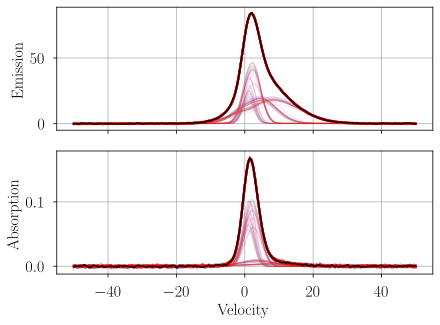

In [14]:
posterior_predictive = model.posterior_predictive_check(
    thin=100, plot_fname=f"{figdir}/posterior_predictive.{ext}"
)
SVG(f"{figdir}/posterior_predictive.{ext}")

In [15]:
model.plot_traces(f"{figdir}/traces.{ext}")
SVG(f"{figdir}/traces.{ext}")

We can inspect the posterior distribution pair plots. First, the cloud parameters.

In [16]:
plot_pair(
    model.trace.solution_0, # samples
    model.cloud_params, # var_names to plot
    "Posterior Cloud Parameters", # plot label
    f"{figdir}/pair_posterior_cloud_params.{ext}", # plot filename
    labeller=model.labeller, # label manager
)
SVG(f"{figdir}/pair_posterior_cloud_params.{ext}")

Notice that there are four posterior modes. These correspond to the four clouds of the model. We can plot the posterior distributions for a single cloud.

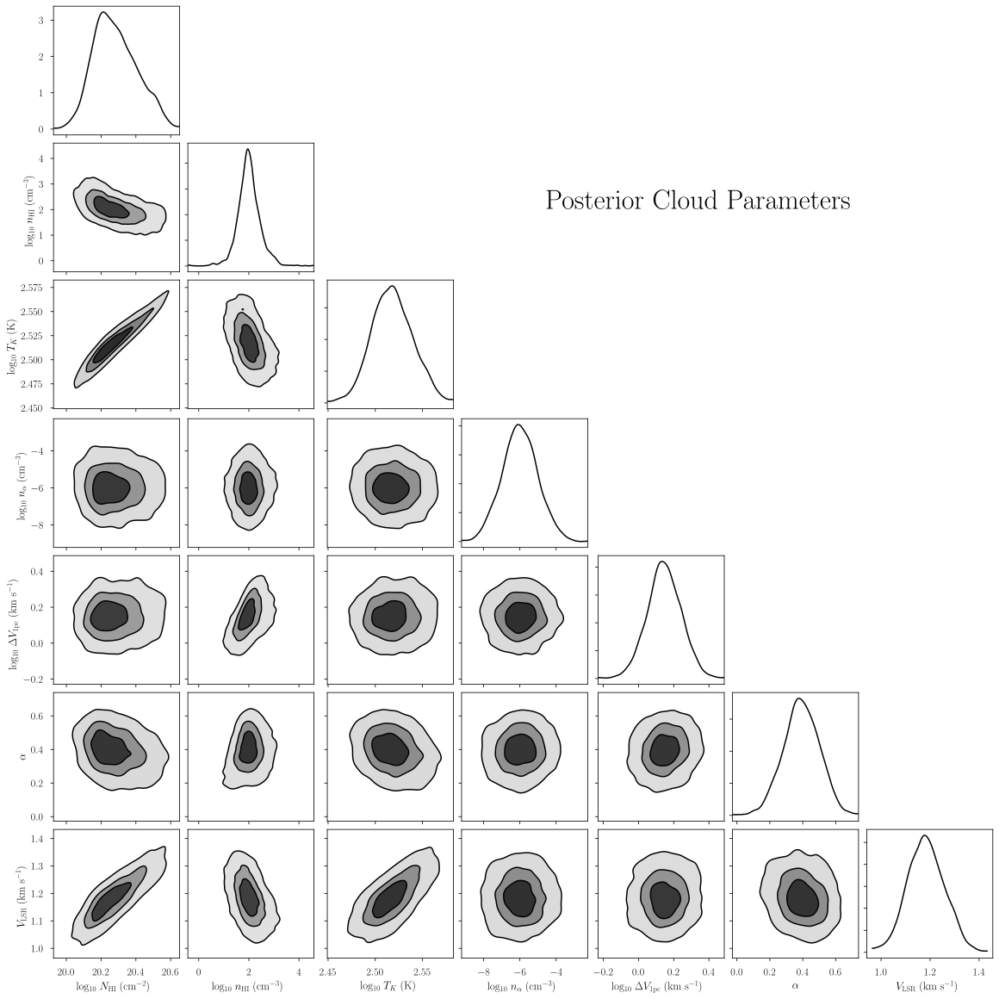

In [17]:
plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    model.cloud_params, # var_names to plot
    "Posterior Cloud Parameters", # plot label
    f"{figdir}/pair_posterior_cloud_params_0.{ext}", # plot filename
    labeller=model.labeller, # label manager
)
SVG(f"{figdir}/pair_posterior_cloud_params_0.{ext}")

Finally, we can get the posterior statistics, Bayesian Information Criterion (BIC), etc.

In [18]:
point_stats = az.summary(model.trace.solution_0, var_names=model.cloud_params, kind='stats', hdi_prob=0.68)
print("BIC:", model.bic())
display(point_stats)

BIC: 1810.8584545996396


,mean,sd,hdi_16%,hdi_84%
log10_NHI[0],20.283,0.124,20.135,20.382
log10_NHI[1],20.693,0.054,20.680,20.753
log10_NHI[2],20.687,0.034,20.650,20.713
log10_NHI[3],20.822,0.033,20.804,20.859
log10_density[0],1.998,0.454,1.618,2.381
log10_density[1],1.301,0.460,1.102,1.873
log10_density[2],0.699,0.569,0.168,1.164
log10_density[3],0.284,0.512,-0.145,0.724
log10_kinetic_temp[0],2.518,0.021,2.495,2.537
log10_kinetic_temp[1],2.723,0.027,2.689,2.736
